<a href="https://colab.research.google.com/github/mthang1801/machine-learning/blob/main/tensorflow/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import pandas as pd
import numpy as np

This is Colab notebook

In [2]:
# !unzip "drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog Vision/"

# End-to-end multiclass Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using TensoFlow 2.0 and TensorFlow Hub

## Problem
Identifying the breed of the dog given an image of a dog.

## Data
The data is used from Kaggle's dog breed identification competition

https://www.kaggle.com/c/dog-breed-identification/data

## Evaluation

The evaluation is a file with prediction propabilities for each dog breed of each test image.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

## Features



Some information about data: 
* We're dealing with images( unstructured data) so it's probably best we use deel learning/ transfer learning
* There are  120 datasets comprises breeds of dogs.
* There are over 10000+ images in the trainning set (These images have labels)
* There are over 10000+ images in the test set (These images have no labels)

In [3]:
# Import Tesorflow into Colab
import tensorflow as tf
print(f"TF version: {tf.__version__}")

TF version: 2.3.0


## Get our workspace ready

* Import TensorFlow2.0
* Import TensorFlow Hub
* Make sure we'are using GPU

In [4]:
# Import nessesary tools
import tensorflow as tf
import tensorflow_hub as hub

# Check for GPU available

print("GPU", "available YES" if tf.config.list_physical_devices("GPU") else "not available")

GPU available YES


### Observe TensorFlow speedup on GPU relative to CPU

This example constructs a typical convolutional neural network layer over a
random image and manually places the resulting ops on either the CPU or the GPU
to compare execution speed.


In [5]:
%tensorflow_version 2.x
import tensorflow as tf
import timeit

device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  print(
      '\n\nThis error most likely means that this notebook is not '
      'configured to use a GPU.  Change this in Notebook Settings via the '
      'command palette (cmd/ctrl-shift-P) or the Edit menu.\n\n')
  raise SystemError('GPU device not found')

def cpu():
  with tf.device('/cpu:0'):
    random_image_cpu = tf.random.normal((100, 100, 100, 3))
    net_cpu = tf.keras.layers.Conv2D(32, 7)(random_image_cpu)
    return tf.math.reduce_sum(net_cpu)

def gpu():
  with tf.device('/device:GPU:0'):
    random_image_gpu = tf.random.normal((100, 100, 100, 3))
    net_gpu = tf.keras.layers.Conv2D(32, 7)(random_image_gpu)
    return tf.math.reduce_sum(net_gpu)
  
# We run each op once to warm up; see: https://stackoverflow.com/a/45067900
cpu()
gpu()

# Run the op several times.
print('Time (s) to convolve 32x7x7x3 filter over random 100x100x100x3 images '
      '(batch x height x width x channel). Sum of ten runs.')
print('CPU (s):')
cpu_time = timeit.timeit('cpu()', number=10, setup="from __main__ import cpu")
print(cpu_time)
print('GPU (s):')
gpu_time = timeit.timeit('gpu()', number=10, setup="from __main__ import gpu")
print(gpu_time)
print('GPU speedup over CPU: {}x'.format(int(cpu_time/gpu_time)))

Time (s) to convolve 32x7x7x3 filter over random 100x100x100x3 images (batch x height x width x channel). Sum of ten runs.
CPU (s):
3.1245547359999932
GPU (s):
0.10586988699998301
GPU speedup over CPU: 29x


#  Getting data ready

With all machine learning models, our data has to be in numerical format. So that's what we'll be doing first. Turning our images into Tensors( numerical representations) 

Let's start by accessing our data and checking our labels

In [6]:
# Checkout the labels of our data
import pandas as pd 
labels_csv = pd.read_csv("/content/drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     ef91df1385e44b81c78dd345b1a17f14  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


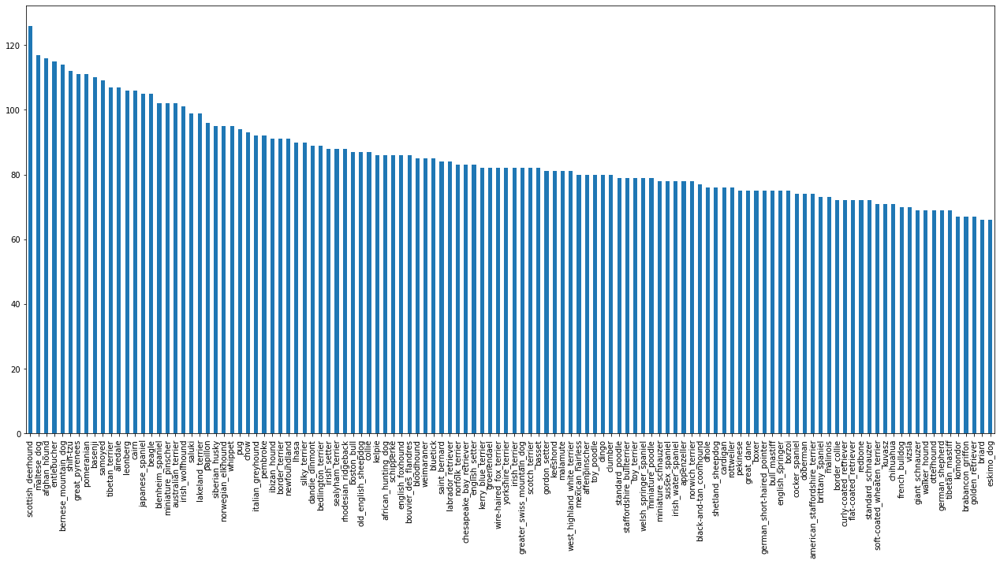

In [7]:
labels_csv.breed.value_counts().plot(kind="bar",figsize=(22,10))

In [8]:
labels_csv.breed.value_counts().median()

82.0

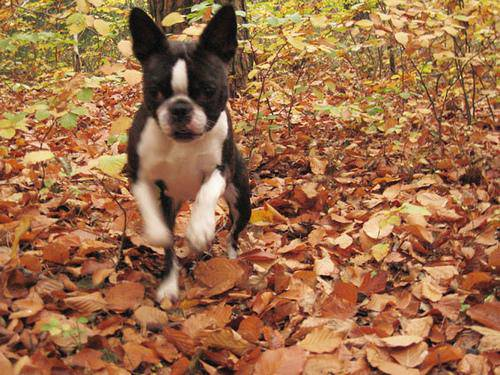

In [9]:
from IPython.display import Image
Image("/content/drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

## Getting images and their labels

Let's get a list of all images from filepath

In [10]:
labels_csv.head()  

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [11]:
# Create pathnames from image ID's
filenames = ["/content/drive/MyDrive/Dog Vision/train/"+id+".jpg" for id in labels_csv["id"]]
# Check first 10 rows
filenames[:10] , len(filenames)

(['/content/drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
  '/content/drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
  '/content/drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
  '/content/drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
  '/content/drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
  '/content/drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
  '/content/drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
  '/content/drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
  '/content/drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
  '/content/drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg'],
 10222)

In [12]:
# Check if number of filenames matches number of actual image files
import os 
if len(os.listdir("/content/drive/MyDrive/Dog Vision/train/")) == len(filenames) :
  print("Filenames matche actual amount of files")
else :
  print("Filenames dont match actual amount of files, check target directory")

Filenames matche actual amount of files


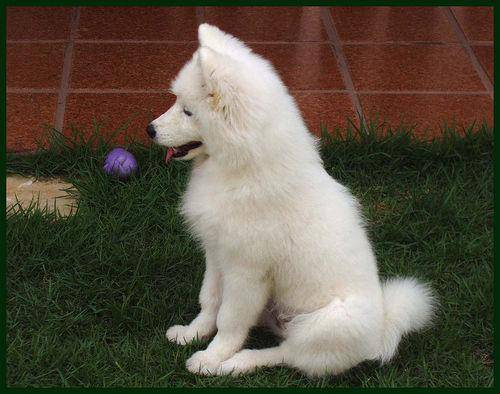

In [13]:
# one more check
Image(filenames[9999])

In [14]:
labels_csv.breed[9999]

'samoyed'

Since we've now got our trainning image filepaths in a list, let's prepare labels

In [15]:
import numpy as np
labels = labels_csv.breed.to_numpy()
labels, len(labels)

(array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
        'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object),
 10222)

In [16]:
# See if length of labels matches the number of filenames
if len(labels) == len(filenames):
  print("labels matches the number of filenames")
else : 
  print("labels don't match the number of filenames")

labels matches the number of filenames


In [17]:
# Find the unique label values
# unique_labels = labels_csv.breed.unique() 
unique_labels = np.unique(labels)
len(unique_labels)

120

In [18]:
# Turn a single label into an array of booleans
print(labels[0])
boolean_labels = labels[0] == unique_labels

boston_bull


In [19]:
# Example: Turning boolean array into integers
print(labels[0])
print(np.where(labels[0] == unique_labels)) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occur in boolean
print(boolean_labels[0].astype(int)) # there will be a 1 where label occurs

boston_bull
(array([19]),)
0
0


In [20]:
# Turn every label into a boolean array
boolean_labels = [label == unique_labels for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [21]:
len(boolean_labels)

10222

In [22]:
filenames[:10]

['/content/drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [23]:
print(boolean_labels[2])
print(boolean_labels[2].astype(int))

[False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False  True False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False]
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our validation set
Since the dataset from Kaggle doesn't come with a validation set, we're going to create our own

In [24]:
# Setup x & y variables
x = filenames
y = boolean_labels

In [25]:
len(x)

10222

We're going to start off experimenting with ~1000 images and increase as needed

In [26]:
# Set number of image to use for experimenting
NUM_IMAGES = 1000 # @param {type : "slider", min:1000, max: 10000, step :100}

In [27]:
# Let's split our data into train and validation
from sklearn.model_selection import train_test_split

# Split them into trainning and validation of total size NUM_IMAGES 
x_train, x_val, y_train, y_val = train_test_split(x[:NUM_IMAGES],y[:NUM_IMAGES], train_size=0.8, random_state=42)
len(x_train) , len(x_val), len(y_train) , len(y_val)

(800, 200, 800, 200)

In [28]:
# Let's have a geeze at the trainning data
x_train[:5], y_train[:2]

(['/content/drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  '/content/drive/MyDrive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  '/content/drive/MyDrive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  '/content/drive/MyDrive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         Fals

# Preprocessing Images( turning images into Tensors)

To preprocess our images into Tensors, we're going to write a function which does a few things : 

1. Take an image filepath as input 
2. Use TF to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize image (convert color channel values from 0-255 to 0-1)
5. Resize the `image` to be a shape of (224,224)
6. Return the modified `image`



In [29]:
# Before we do, let's see what importing an image looks like
# Convert image to numpy array
from matplotlib.pyplot import imread

image = imread(filenames[1])
image.shape

(375, 500, 3)

In [30]:
image[:2]

array([[[ 51,  34,  27],
        [ 55,  38,  30],
        [ 61,  42,  35],
        ...,
        [128,  92,  60],
        [ 78,  42,  10],
        [168, 132, 100]],

       [[ 62,  45,  37],
        [ 64,  45,  38],
        [ 63,  45,  35],
        ...,
        [115,  81,  53],
        [ 46,  12,   0],
        [ 73,  39,  11]]], dtype=uint8)

In [31]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 500, 3), dtype=uint8, numpy=
array([[[ 51,  34,  27],
        [ 55,  38,  30],
        [ 61,  42,  35],
        ...,
        [128,  92,  60],
        [ 78,  42,  10],
        [168, 132, 100]],

       [[ 62,  45,  37],
        [ 64,  45,  38],
        [ 63,  45,  35],
        ...,
        [115,  81,  53],
        [ 46,  12,   0],
        [ 73,  39,  11]]], dtype=uint8)>

In [32]:
image.max(), image.min()

(255, 0)

Now we've seen what an image look like as a Tensor, let's make a function to preprocess them.

1. Take an image filepath as input 
2. Use TF to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize image (convert color channel values from 0-255 to 0-1)
5. Resize the `image` to be a shape of (224,224)
6. Return the modified `image`



In [33]:
# Define image size 
IMAGE_SIZE = 224
# Create a function to preprocessing images
def preprocess_image(img_path, img_size=IMAGE_SIZE) : 
  """
  Take an image file path and turn into Tenso
  """
  # 2. Read in an image file
  image = tf.io.read_file(img_path)
  # 3. Turn the jpg image into numerical Tensor with 3 colors channel RGB
  image = tf.image.decode_jpeg(image,channels=3)
  # 4. Convert color channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image,tf.float32)
  # 5. Resize the image to be a shape of (224,224)
  image = tf.image.resize(image, size=[img_size, img_size])
  # 6. Return the modified image
  return image

In [34]:
# example
image = tf.io.read_file(filenames[1])
image = tf.image.decode_jpeg(image, channels=3)
image = tf.image.convert_image_dtype(image,tf.float32)
image = tf.image.resize(image,size=[IMAGE_SIZE, IMAGE_SIZE])
image

<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[0.22176053, 0.1532646 , 0.12077089],
        [0.24290617, 0.17007563, 0.12532842],
        [0.25025794, 0.16272292, 0.10750583],
        ...,
        [0.4866906 , 0.31810698, 0.18481737],
        [0.46775866, 0.32910115, 0.20204483],
        [0.36027768, 0.2283099 , 0.11981372]],

       [[0.22331059, 0.14479166, 0.10454448],
        [0.20956516, 0.13433544, 0.08120592],
        [0.20576334, 0.11818807, 0.06297097],
        ...,
        [0.34747207, 0.21052358, 0.10098223],
        [0.25428382, 0.14531395, 0.05989731],
        [0.22268865, 0.11715643, 0.03506609]],

       [[0.21673436, 0.12777252, 0.0741048 ],
        [0.20701681, 0.11805496, 0.05878148],
        [0.22288738, 0.12433178, 0.0666433 ],
        ...,
        [0.19956292, 0.10319562, 0.05528758],
        [0.24323113, 0.17113218, 0.12510629],
        [0.17322923, 0.11525137, 0.08183777]],

       ...,

       [[0.71888185, 0.40606675, 0.10109472],
        [0.72

# Turning our data into batches

Why turn our data into batches ? 

Let's say we are trying to process 10,000+ images in one go... they all might not fit into memory

So that's why we do 32 ( batch size ) images at a time ( we can manually adjust the batch size if need be).

To use TF effectively, we need our data in the form of Tensor tuples which look like this : `(image, label)`


In [35]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label): 
  """
  Takes an image file path name and associated label, precess the image and return a tuples of (image, label)
  """
  image = preprocess_image(image_path)
  return image, label

In [36]:
#Demo of above
get_image_label(x[42],y[42])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors in the forms : `(image, label)`, let's make a function to turn all of our data (`X` and `y`) into batches

In [37]:
 # Define a batch size, 32 is a good to start
 BATCH_SIZE = 32

 # Create a function to turn data into batches
 def create_data_batches(x,y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False) : 
  """
  Create batches of data out of image(x) and label(y) pairs
  Shuffles the data if it's trainning data but doesn't shuffle if it's validation data.
  Also accept test data as input (no labels)
  """
  # If the data is test dataset, we probably don't have labels
  if test_data :
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices(tf.constant(x)) # only filepaths (no labels)
    data_batch = data.map(preprocess_image).batch(batch_size)
    return data_batch

  # If the data is valid data, we don't need to shuffle it
  elif valid_data: 
    print("Creating valid data batches...")
    data = tf.data.Dataset.from_tensor_slices( (tf.constant(x), # filepaths
                                                tf.constant(y) )) # labels
    data_batch = data.map(get_image_label).batch(batch_size)                                               
    return data_batch

  else : 
    print("Creating trainning data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices( (tf.constant(x),
                                                tf.constant(y)))
    # Shuffle pathnames and labels before mapping image processor function is faster than shuffle images
    data = data.shuffle(buffer_size=len(x))

    # Create (image, label) tuples 
    data = data.map(get_image_label)

    # Turn the trainning data into batches
    data_batch = data.batch(batch_size)
    return data_batch

In [38]:
# Create trainning and validation data batches
train_data = create_data_batches(x_train, y_train)
valid_data = create_data_batches(x_val, y_val, valid_data=True)

Creating trainning data batches...
Creating valid data batches...


In [39]:
# Checkout the different attributes of our data batches
train_data.element_spec, valid_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

# Visualizing Data batches

In [40]:
import matplotlib.pyplot as plt 

def show_25_images(images, labels) : 
  """
  Display the plot of 25 images and their labels from data batches
  """
  # Setup config 
  plt.figure(figsize=(10,10))
  # Loop through 25 images
  for i in range(25) : 
    ax = plt.subplot(5,5,i+1)
    # Display image
    plt.imshow(images[i])
    # Add image title    
    plt.title(unique_labels[labels[i].argmax()],color="green")
    # Turn the grid line off
    plt.axis("off")

In [41]:
train_images, train_labels = next(train_data.as_numpy_iterator())

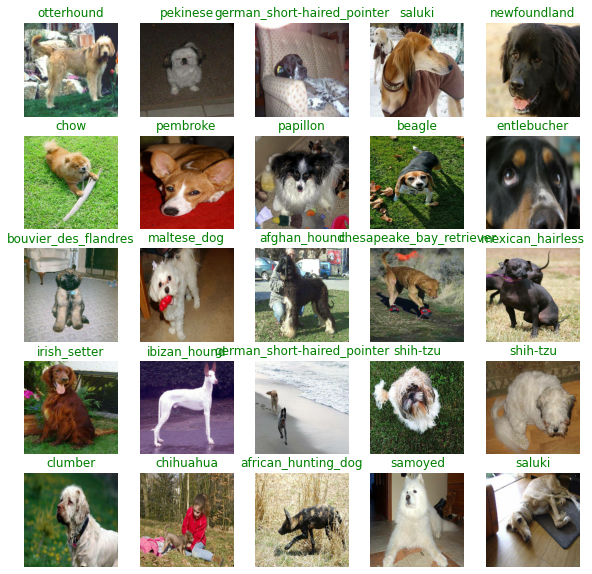

In [42]:
# Let's visualize train data
show_25_images(train_images, train_labels)

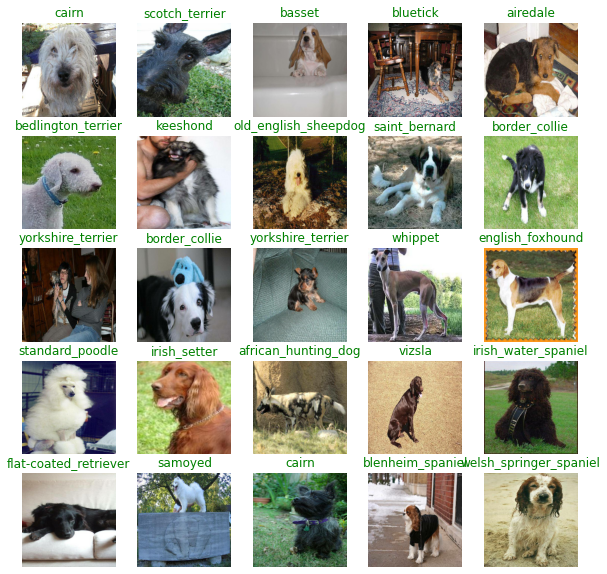

In [43]:
# Let's visualize validation data
val_images , val_labels = next(valid_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

# Building a model

There are few things we need to define : 
  * Input shape (images shape in the form of Tensors) of model
  * Output shape ( labels, in the form of Tensors) of model
  * The URL of the model we want to use from TensorFlow Hub

In [44]:
# Set up input shape to the model
INPUT_SHAPE = [None , IMAGE_SIZE, IMAGE_SIZE, 3] # batch size, width, height, color channels
OUTPUT_SHAPE = len(unique_labels)
MODEL_URL="https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"
INPUT_SHAPE, OUTPUT_SHAPE


([None, 224, 224, 3], 120)

Now we've got our inputs, outputs and model ready to go

Knowing this, let's create a function which : 
* Takes the inputs shape, output shape and the model we've choosen  as parameters
* Define the layers in the Keras model in sequential fashion( do this first, then this, then that) 
* Compiles the model (says it should be evaluated and improved)
* Build the model( tell the model the input shape, it'll be getting)
* Return the model

In [45]:
# Create function which build keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL): 
  print(f"Building model with: {model_url} ")
  # Setup model layer
  model = tf.keras.Sequential([
        hub.KerasLayer(model_url), 
        tf.keras.layers.Dense(units=OUTPUT_SHAPE,activation="softmax")
  ])
  # Compile the model
  model.compile(loss=tf.keras.losses.CategoricalCrossentropy(), optimizer=tf.keras.optimizers.Adam(), metrics=["accuracy"])

  # Build the model
  model.build(INPUT_SHAPE)
  return model



In [46]:
# model = create_model()
# model.summary()

# Creating callbacks

Callback are helper fucnctions a model can use during trainning to do such things as save its progress, check its progress or stop trainning early if a model stops improving

We'll create 2 callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from trainning for too long.

## TensorBoard Callback

To setup a Tensorboard callback, we need 3 things : 
1. Load the TensorBoard notebook extensions 
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function
3. Visualize our models trainning logs with the `%tensorboard` magic function

In [47]:
# Load TensorBoard Notebook extension
%load_ext tensorboard

In [48]:
import datetime
import os
#Create a function to build Tensorboard callback
def create_tensorboard_callback() : 
  # Create a log directory for storing tensorboard log
    logdir = os.path.join("/content/drive/MyDrive/Dog Vision/logs",
                          # Make it so the logs get tracked whenever we run an experiment
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
                          )
    return tf.keras.callbacks.TensorBoard(logdir)

# Early stopping callback

Early stopping helps stop model from over fitting by stop trainning if a certain evaluation metric stop improving

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [49]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy", patience=3)

# Trainning a model( on subdet of data ) 

First model is only going to train 1000 images, to make sure everything is working

In [50]:
NUM_EPOCHS=100 #@param {type : "slider", min: 10, max: 100, step : 10}

In [51]:
print("GPU is working", "Yes" if tf.config.list_physical_devices("GPU") else "Not available")

GPU is working Yes


# Let's create a function trainning model
* Create a function using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on model passing it the trainning data, validation data, number of epochs to train for(`NUM_EPOCHS`) and callback we'd like to use
* Return the model

In [52]:
# Build a function to train and return a trainned model
def train_model()  : 
  """
  Trains a given model and returns the trained version
  """
  # Create a model
  model = create_model() 
  # Create new TensorBoard session everytime we train model
  tensorboard = create_tensorboard_callback()
  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=valid_data,
            validation_freq=1,
            callbacks=[tensorboard,early_stopping]
            )
  return model

In [53]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4 
Epoch 1/100
 1/25 [>.............................] - ETA: 0s - loss: 6.0517 - accuracy: 0.0000e+00WARNING:tensorflow:From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/summary_ops_v2.py:1277: stop (from tensorflow.python.eager.profiler) is deprecated and will be removed after 2020-07-01.
Instructions for updating:
use `tf.profiler.experimental.stop` instead.


Instructions for updating:
use `tf.profiler.experimental.stop` instead.


25/25 [==============================] - 373s 15s/step - loss: 4.7754 - accuracy: 0.0825 - val_loss: 3.6011 - val_accuracy: 0.2450
Epoch 2/100
25/25 [==============================] - 4s 165ms/step - loss: 1.7272 - accuracy: 0.6787 - val_loss: 2.2192 - val_accuracy: 0.5100
Epoch 3/100
25/25 [==============================] - 4s 166ms/step - loss: 0.6018 - accuracy: 0.9337 - val_loss: 1.7169 - val_accuracy: 0.5850
Epoch 4/100
25/25 [==============================] - 4s 161ms/step - loss: 0.2637 - accuracy: 0.9825 - val_loss: 1.5518 - val_accuracy: 0.6300
Epoch 5/100
25/25 [==============================] - 4s 165ms/step - loss: 0.1532 - accuracy: 0.9950 - val_loss: 1.4690 - val_accuracy: 0.6300
Epoch 6/100
25/25 [==============================] - 4s 164ms/step - loss: 0.1050 - accuracy: 1.0000 - val_loss: 1.4096 - val_accuracy: 0.6500
Epoch 7/100
25/25 [==============================] - 4s 165ms/step - loss: 0.0777 - accuracy: 1.0000 - val_loss: 1.3819 - val_accuracy: 0.6550
Epoch 8/100

**Question** : It looks like model is overfitting because it's performing far better on the trainning dataset than the validation dataset, what are some ways to prevents model over fitting in deep learning neural networks ?

### Checking the TensorBoard

The TensorBoard magic function `(%tensorboard)` will access the logs directly we created earlier and visualize its contents

In [54]:
%tensorboard --logdir /content/drive/MyDrive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making and evaluation prediction using a trained model

In [55]:
valid_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [56]:
predictions = model.predict(valid_data, verbose = 1 )
predictions

7/7 [==============================] - 1s 106ms/step


array([[2.09640409e-03, 6.61275626e-05, 1.00044801e-03, ...,
        2.17560373e-04, 9.49497771e-05, 7.25023495e-03],
       [5.75437618e-04, 4.07968735e-04, 4.20796266e-03, ...,
        3.31099640e-04, 1.29428948e-03, 1.25584789e-04],
       [9.69820576e-06, 9.29121088e-05, 7.56596419e-05, ...,
        1.72494438e-05, 8.23450900e-05, 1.98297959e-04],
       ...,
       [2.59426702e-06, 3.21704101e-05, 2.66682764e-05, ...,
        1.10683077e-05, 2.32042967e-05, 2.52448026e-05],
       [2.15554168e-03, 5.04471827e-04, 3.05898138e-04, ...,
        2.27379918e-04, 7.37170194e-05, 1.13482038e-02],
       [1.12831476e-03, 3.07939081e-05, 6.02483575e-04, ...,
        1.45512493e-02, 7.20467302e-04, 1.07756154e-04]], dtype=float32)

In [57]:
np.sum(predictions[0])

1.0

In [58]:
# First prediction
index = 113
print(predictions[index])
print(f"Max value (probability of preduction) : {np.max(predictions[index])}  ") 
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label : {unique_labels[np.argmax(predictions[index])]} ")

[3.6950163e-03 4.0287280e-04 1.5756999e-04 4.8203609e-04 9.9174306e-03
 1.3806100e-04 1.2428597e-01 6.6805161e-03 5.2581012e-04 1.0947052e-03
 3.6783735e-04 5.0017168e-04 9.1022090e-04 1.2145737e-04 3.8780126e-04
 4.6700693e-04 9.2652968e-05 7.5607620e-02 3.1002940e-04 6.8608957e-04
 3.3164106e-04 4.8982853e-04 7.3293800e-04 2.7420453e-04 1.2974765e-03
 6.1546554e-05 2.8317599e-03 4.5972478e-04 1.1245029e-04 3.5951778e-03
 5.3436554e-04 6.9499400e-04 2.9290426e-03 9.1599120e-04 3.4272909e-04
 2.6749089e-02 8.9548375e-06 6.0974888e-04 2.0545378e-04 4.8775328e-04
 1.3866496e-03 6.1549188e-05 7.7192766e-05 1.8470279e-04 4.6791814e-04
 6.9977727e-04 8.6778899e-05 4.5668936e-04 1.2501693e-04 2.4422886e-02
 1.1916861e-04 9.6594726e-05 3.4142836e-04 2.7271502e-05 6.7263364e-04
 2.2334667e-05 9.4831164e-05 7.3813531e-03 1.5642191e-04 6.4171492e-03
 2.7518459e-03 5.3664608e-05 2.1019058e-04 1.4378688e-04 1.1608934e-03
 6.1283914e-05 4.9891445e-04 7.7912729e-04 4.0181211e-01 1.2936236e-04
 1.789

Having the above functionality is great but we want want to be able to to it at scale

And it would be even better if we could see the image from the prediction is being made on

**Note**: Prediction probabilities are also known as confidence levels

In [59]:
# turn prediction probabilities into their respective label
def get_pred_label(prediction_probabilities) : 
  """
  Turn an array of prediction probabilities into a label
  """
  return unique_labels[prediction_probabilities.argmax()]

# Get a predict label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'dingo'

Now since our validation data is still in batch dataset, we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the valid images( truth labels) 

In [60]:
valid_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [61]:
# Create a function to unbatch a batch dataset
def unbatchify(data) : 
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays of images and labels 
  """
  images_ = []
  labels_ = []
  for image, label in data.unbatch().as_numpy_iterator() : 
    images_.append(image)
    labels_.append(unique_labels[label.argmax()])
  return images_, labels_

# unbatchify validation data
val_images, val_labels = unbatchify(valid_data)

In [62]:
get_pred_label(predictions[2])

'basset'

Now we've got ways to get : 
  * Prodictions labels
  * Validation labels
  * Validation images 

Let's make some function to make these all a bit more visualization

We'll create a function which : 
* Takes an array of prediction probabilities, an array of truth labels and an array of images and integers
* Convert the prediction probabilities to a predicted label
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot

In [63]:
def plot_pred(prediction_probabilities, labels, images,  n = 1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob , true_label, image = prediction_probabilities[n] , labels[n], images[n]

  # Get the predict label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])
  
  # Change colour of title depending on if the prediction is right or wrong
  if pred_label == true_label: 
    color = "green"
  else : 
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:.2f}% {}".format(pred_label, np.max(pred_prob)*100, true_label),color=color)

   

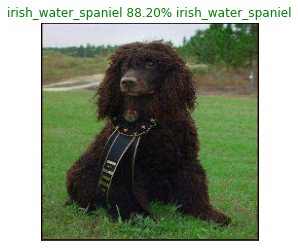

In [64]:
plot_pred(predictions, val_labels, val_images, n=19)

Now we've got one function to visualize our models top prediction, let's make another to view our models top 10 predictions

This function will : 
* Take an input of prediction probabilities array and a ground truth  array and an integer
* Find the prediction using `get_pred_label()`
* Find top 10 : 
  * Prediction probabilities index
  * Prediction probabilities values
  * Prodiction labels
* Plot top 10 prediction probability values and labels, coloring the true label green

In [65]:
def plot_pred_conf(prediction_probabilities, labels, n=1) : 
  """
  Plus top 10 highest prediction confidences along with the truth label in sample n
  """
  pred_prob, true_labels = prediction_probabilities[n] ,  labels[n]
  # Get predict labels
  pred_label = get_pred_label(pred_prob)
  # Find top 10 prediction highest confidence indexes 
  top_10_pred_index = pred_prob.argsort()[-10:][::-1]
  # Find top 10 prediction highest confidence values
  top_10_pred_values = pred_prob[top_10_pred_index]
  # Find top 10 preduction highest labels
  top_10_pred_labels = unique_labels[top_10_pred_index]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)), top_10_pred_values, color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)), labels=top_10_pred_labels, rotation="vertical")

  # Change color true label
  if np.isin(true_labels, top_10_pred_labels) : 
    top_plot[np.argmax(top_10_pred_labels == true_labels)].set_color("green")
  else : 
    pass 

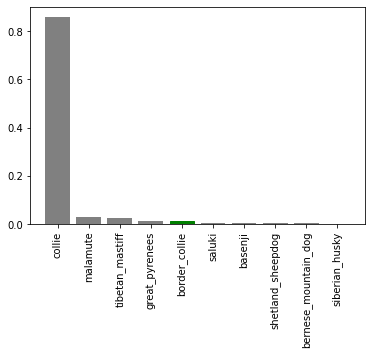

In [66]:
plot_pred_conf(predictions, val_labels, n=9)

In [67]:
predictions[0].argsort()[-10:][::-1]

array([ 59,   6,  70,  26,  17, 102,  83, 103, 100,  35])

In [68]:
unique_labels[predictions[0].argsort()[-10:][::-1]]

array(['irish_wolfhound', 'australian_terrier', 'lhasa', 'cairn',
       'border_terrier', 'silky_terrier', 'otterhound',
       'soft-coated_wheaten_terrier', 'shih-tzu', 'dandie_dinmont'],
      dtype=object)

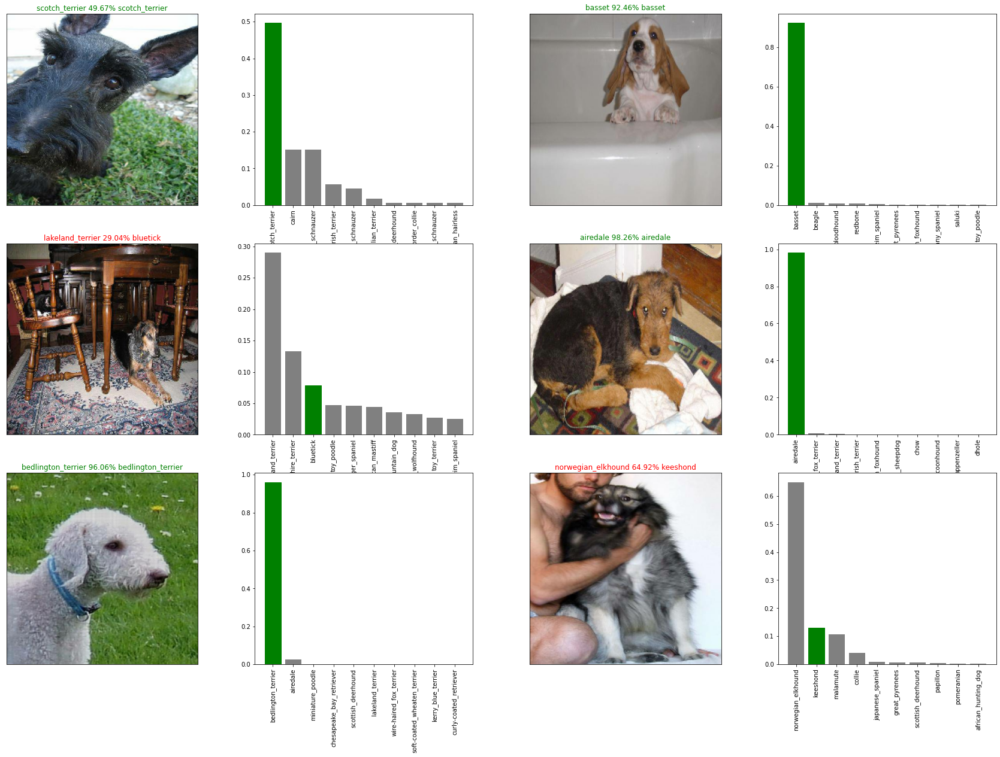

In [69]:
# Let's checkout a few predictions and their different values
i_multiplier = 1
num_rows = 3
num_cols =2 
num_images = num_rows * num_cols 
plt.figure(figsize=(10*num_rows, 5*num_cols*2))
for i in range(num_images) : 
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions, labels=val_labels, images=val_images, n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions, labels=val_labels,n =i+i_multiplier)
plt.show()

# Saving and reloading trained model


In [70]:
# Create a function to save model
def save_model(model, suffix=None) : 
  """
  Saving a given model in a models directory and appends a suffix (string)
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("/content/drive/MyDrive/Dog Vision/models", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to : {model_path}...")
  model.save(model_path)
  return model_path

In [71]:
# Create a function to load the trained model
def load_model(model_path) : 
  """
  Load a saved data from a specified path
  """
  print(f"Loading saved model from : {model_path}")
  model = tf.keras.models.load_model(model_path,custom_objects={"KerasLayer" : hub.KerasLayer})
  return model

In [72]:
# Save model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetV2-Adam")

Saving model to : /content/drive/MyDrive/Dog Vision/models/20201122-235022-1000-images-mobilenetV2-Adam.h5...


'/content/drive/MyDrive/Dog Vision/models/20201122-235022-1000-images-mobilenetV2-Adam.h5'

In [73]:
# Load a trained model
loaded_1000_images_model = load_model("/content/drive/MyDrive/Dog Vision/models/20201122-165110-1000-images-mobilenetV2-Adam.h5")
loaded_1000_images_model

Loading saved model from : /content/drive/MyDrive/Dog Vision/models/20201122-165110-1000-images-mobilenetV2-Adam.h5


In [74]:
model

In [75]:
# Evaluate the pre-saved model
model.evaluate(valid_data)

7/7 [==============================] - 1s 85ms/step - loss: 1.2900 - accuracy: 0.6750


[1.289992332458496, 0.675000011920929]

In [76]:
# Evaluate the loaded model
loaded_1000_images_model.evaluate(valid_data)

7/7 [==============================] - 1s 85ms/step - loss: 1.2258 - accuracy: 0.6950


[1.2257996797561646, 0.6949999928474426]

# Training a big dog model

In [77]:
len(x), len(y)

(10222, 10222)

In [78]:
x[:10]

['/content/drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [79]:
y[:10]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [80]:
# Create data batch with full dataset
full_data = create_data_batches(x,y)

Creating trainning data batches...


In [81]:
full_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [82]:
#Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4 


In [83]:
# create full odel callbacks : 
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all data, so we can't monitor valiation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy", patience=3)

**Note** : Running the cell below will take a little while ( may be up 30 minutes for the first epoch) because  GPU we're using in the runtime has to load all of the images into memory.

In [84]:
# Fit the full model to full data
model.fit(x=full_data,
          epochs=NUM_EPOCHS,
          callbacks=[full_model_tensorboard, full_model_early_stopping]
          )

Epoch 1/100
320/320 [==============================] - 3883s 12s/step - loss: 0.7908 - accuracy: 0.7754
Epoch 2/100
320/320 [==============================] - 37s 116ms/step - loss: 0.2835 - accuracy: 0.9158
Epoch 3/100
320/320 [==============================] - 37s 116ms/step - loss: 0.1626 - accuracy: 0.9554
Epoch 4/100
320/320 [==============================] - 37s 115ms/step - loss: 0.1050 - accuracy: 0.9763
Epoch 5/100
320/320 [==============================] - 37s 116ms/step - loss: 0.0751 - accuracy: 0.9861
Epoch 6/100
320/320 [==============================] - 37s 116ms/step - loss: 0.0563 - accuracy: 0.9918
Epoch 7/100
320/320 [==============================] - 37s 115ms/step - loss: 0.0445 - accuracy: 0.9941
Epoch 8/100
320/320 [==============================] - 37s 115ms/step - loss: 0.0356 - accuracy: 0.9966
Epoch 9/100
320/320 [==============================] - 37s 117ms/step - loss: 0.0295 - accuracy: 0.9970
Epoch 10/100
320/320 [==============================] - 37s 115m

In [85]:
# Save full model
save_model(full_model, suffix="full-image-set-mobilenetV2-Adam")

Saving model to : /content/drive/MyDrive/Dog Vision/models/20201123-010816-full-image-set-mobilenetV2-Adam.h5...


'/content/drive/MyDrive/Dog Vision/models/20201123-010816-full-image-set-mobilenetV2-Adam.h5'

In [96]:
# Load full model
loaded_full_model = load_model("/content/drive/MyDrive/Dog Vision/models/20201123-010816-full-image-set-mobilenetV2-Adam.h5")

Loading saved model from : /content/drive/MyDrive/Dog Vision/models/20201123-010816-full-image-set-mobilenetV2-Adam.h5


# Making predictions on test dataset

Because our model has been trained on images in the form of Tensor batches, to make predictions on the test dataset, we'll have to get it into the same format

Luckily, we have already created `create_data_batches()` earlier which can take a list of filenames as input and cover them into Tensor batches.

To make predictions on the test data, we will : 
* Get the test images filenames. 
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data()` parameter to `True` (since the test data doesn't have label) 
* Make a predictions array by passing the test batches to the `predict()` method callled on our model


In [90]:
# Load test image filenames
file_path = "/content/drive/MyDrive/Dog Vision/test/"
test_filenames = [file_path + filename for filename in os.listdir(file_path)]
test_filenames[:5]

['/content/drive/MyDrive/Dog Vision/test/e8eca3dc497d4bb15b0254bc9f56cdd7.jpg',
 '/content/drive/MyDrive/Dog Vision/test/ee457ce7dc7f426aa7704b9864960528.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e8b49a4b2c22d3c5cb3c88c61654e991.jpg',
 '/content/drive/MyDrive/Dog Vision/test/ec0efefd564e6632ca11b424b6dcd2d4.jpg',
 '/content/drive/MyDrive/Dog Vision/test/f1dcabbeb1dbebb326a4b029b6f8b188.jpg']

In [92]:
len(test_filenames)

10357

In [97]:
# Create the test data batches
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [99]:
# Make predictions on test data batch using the loaded full model
test_predictions = model.predict(test_data, verbose=2)

KeyboardInterrupt: ignored

In [ ]:
# Save predictions (Numpy array) to csv file (for access later)
np.savetxt("/content/drive/MyDrive/Dog Vision/preds_array.csv", test_predictions, delimiter=",")

In [100]:
# Load predictions (Numpu array) from csv file
test_predictions = np.loadtxt("/content/drive/MyDrive/Dog Vision/dog-vision-prediction-probabilites-array.csv", delimiter=",")

In [101]:
test_predictions.shape

(10357, 120)

## Prepare test dataset predictions from Kaggle

Looking at Kaggle sample submission, we find that it wants our models prediction probability outputs in a DataFrame with an ID and a column for each different dog breed

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

To get the data in this format, we'll: 
* Create a pandas DataFrage with ID columns as well as a column for each dog breed
* Add data to ID column by extracting the test image ID's from their filepaths
* Add data( the prediction probabilities) to each of the dog breed columns
* Export DataFrame as a CSV to submit it to Kaggle


In [125]:
preds_df = pd.DataFrame(columns=["id"] + list(unique_labels))
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [126]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(file_path)]
preds_df["id"]  = test_ids
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e8eca3dc497d4bb15b0254bc9f56cdd7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,ee457ce7dc7f426aa7704b9864960528,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e8b49a4b2c22d3c5cb3c88c61654e991,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,ec0efefd564e6632ca11b424b6dcd2d4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,f1dcabbeb1dbebb326a4b029b6f8b188,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [127]:
# Adding the prediction probabilities to each dog breed column
preds_df[list(unique_labels)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e8eca3dc497d4bb15b0254bc9f56cdd7,1.61196e-09,3.44086e-12,2.32834e-11,1.40799e-12,5.98033e-09,2.14534e-11,5.32852e-10,1.76493e-10,4.49106e-11,1.84297e-09,5.29733e-14,6.22357e-09,5.95073e-13,2.66395e-08,3.28688e-15,1.21886e-11,1.19793e-08,2.38418e-13,4.40796e-10,3.99063e-11,2.83421e-13,3.95439e-12,1.97963e-10,8.23695e-11,1.06677e-05,1.19701e-14,9.42684e-11,6.76077e-11,1.22097e-11,1.13671e-05,2.65429e-12,2.08955e-10,3.13114e-10,2.81222e-09,4.10381e-15,1.54404e-13,8.28562e-12,3.35177e-12,7.26732e-13,...,1.53728e-13,7.92547e-11,1.125e-12,1.63081e-11,0.999948,1.07531e-08,6.96737e-08,2.58429e-05,4.69993e-12,5.38787e-13,4.42572e-15,1.21052e-14,5.82161e-12,2.23169e-11,6.22246e-07,3.04142e-10,2.66839e-11,2.75708e-14,7.93131e-14,1.32076e-06,2.44035e-10,6.31364e-09,1.15631e-08,1.22175e-09,1.5485e-11,8.52924e-12,2.88824e-12,7.2787e-12,2.44715e-14,4.71957e-08,8.20066e-09,4.05677e-08,2.20215e-11,3.07456e-12,7.0806e-12,3.02453e-09,2.99173e-07,1.06918e-13,1.5853e-08,1.52162e-06
1,ee457ce7dc7f426aa7704b9864960528,3.17894e-10,3.20088e-14,1.85375e-10,1.95466e-13,8.68222e-07,3.36228e-07,2.26471e-06,0.999593,1.87668e-10,1.44469e-07,2.03675e-09,5.92063e-12,1.10664e-11,7.59322e-09,6.66672e-11,1.07453e-10,6.06718e-10,6.86744e-10,2.8105e-11,1.3714e-09,8.18679e-12,1.00465e-09,4.08705e-10,7.98117e-13,2.6706e-10,1.88958e-13,2.03424e-10,1.14916e-05,8.09342e-11,7.07004e-08,4.19179e-10,8.6505e-13,1.01143e-13,2.06352e-09,8.75542e-11,1.11979e-14,1.37751e-08,5.86843e-06,2.54069e-10,...,3.98128e-08,9.75653e-12,2.45684e-11,2.453e-13,4.44202e-08,2.08894e-11,4.48524e-06,7.26081e-11,3.35534e-10,9.14727e-08,2.06103e-09,7.40757e-13,1.78977e-11,3.20656e-11,1.8672e-10,1.0017e-08,4.42345e-11,4.78339e-11,3.828e-11,1.22619e-10,3.76022e-09,3.04148e-08,1.34791e-07,2.77854e-10,1.31859e-09,1.09374e-11,4.616e-11,6.4806e-13,3.30366e-13,1.88458e-11,3.44167e-07,0.000112944,6.6752e-09,1.69071e-06,6.80441e-10,5.92343e-09,5.57415e-09,7.00589e-08,1.88822e-08,2.56981e-10
2,e8b49a4b2c22d3c5cb3c88c61654e991,4.27301e-09,1.8414e-13,1.11785e-09,1.10664e-10,7.22501e-11,1.16924e-05,7.22326e-07,0.000555337,9.78565e-11,1.72204e-07,1.12471e-12,5.61475e-06,3.19121e-09,8.96468e-09,6.1726e-12,1.56086e-10,9.55186e-07,7.99785e-12,9.66919e-08,5.34925e-11,1.30223e-12,2.23705e-13,1.57456e-13,9.01699e-12,8.34153e-08,2.40414e-13,1.74604e-10,1.31652e-05,1.00012e-10,1.19407e-07,3.41525e-08,2.56724e-12,7.05523e-11,1.19703e-06,6.52978e-11,1.53339e-11,1.97418e-07,4.31401e-09,1.41566e-10,...,1.26193e-07,1.83583e-07,1.09725e-10,9.71679e-09,1.00777e-06,1.43315e-09,0.999301,1.10322e-09,3.00328e-12,6.40536e-10,4.37618e-13,8.66561e-11,1.54382e-08,3.7188e-10,7.22425e-09,1.6949e-06,1.01102e-09,1.49047e-11,1.07289e-11,4.92782e-06,1.34003e-09,1.47905e-07,2.36387e-07,7.56329e-10,3.09975e-11,1.60226e-10,7.86962e-10,8.08168e-14,2.3197e-11,7.2096e-10,3.53046e-09,4.605e-05,9.58619e-12,2.74033e-08,8.79864e-12,2.79368e-08,1.50221e-07,2.7

In [129]:
# Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv("/content/drive/MyDrive/Dog Vision/full_model_predictions_submission_1_mobilenetV2.csv", index=False)

# Making prediction on custom images

To make predictions on custom images, we'll : 
* Get the filepaths of our own images.
* Turn the filepaths into data batches using `create_data_batches()`. And since our custom image dont have label, we'll set the `test_data()` parameter to True
* Pass the custom image data batch to our model's `predict()` method
* Convert the prediction output probabilities to predict labels
* Compare the predicted labels to the custom images

In [133]:
# Get custom image filepaths
custom_path = "/content/drive/MyDrive/Dog Vision/my-dog-photos/"
custom_images_path = [custom_path+fname for fname in os.listdir(custom_path)] 

In [135]:
custom_images_path 

['/content/drive/MyDrive/Dog Vision/my-dog-photos/dog3.jpeg',
 '/content/drive/MyDrive/Dog Vision/my-dog-photos/dog2.jpg',
 '/content/drive/MyDrive/Dog Vision/my-dog-photos/dog1.png']

In [137]:
# Turn custom images into batches datasets
custom_data = create_data_batches(custom_images_path, test_data=True)
custom_data

Creating test data batches...


<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

In [140]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

In [145]:
len(custom_preds)

3

In [148]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(custom_preds.shape[0]) ]
custom_pred_labels

['irish_wolfhound', 'bedlington_terrier', 'great_dane']

In [150]:
# Get custom images (our unbatchify() function wont work because  there are not labels... may be could fix this later)
custom_images = []
# Loop throuh unbatched data
for image in custom_data.unbatch().as_numpy_iterator() : 
  custom_images.append(image)

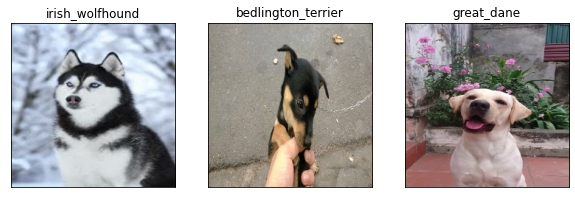

In [152]:
# Check custom image predictions
plt.figure(figsize=(10,10))
for i , image in enumerate(custom_images) : 
  plt.subplot(1,3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)